# EDA

**Mục tiêu:** 
- Nắm được quy mô và đặc điểm của dataset trước khi thiết kế các bước tiền xử lý (Task 1) và phân đoạn (Task 2)
- Phát hiện sớm các vấn đề dữ liệu (ảnh hỏng, ảnh trùng lặp) để đảm bảo tập ảnh dùng cho các thí nghiệm sau là sạch và đáng tin cậy
- Độ phân giải/tỷ lệ khung hình không đồng nhất giữa các ảnh là căn cứ quan trọng để chọn tham số phù hợp ở các task sau (ví dụ ngưỡng diện tích tuyệt đối ở Task 4 cần tính theo tỷ lệ % ảnh thay vì số pixel cố định)

**Input:** 
- Bộ dữ liệu biển báo giao thông Việt Nam - VNST trên Kaggle
- File cấu hình `config.yaml` chứa đường dẫn ảnh/nhãn

**Output:**
- Thống kê tổng quan về dataset: Số lượng ảnh, độ phân giải, tỷ lệ khung hình, độ sáng
- Danh sách ảnh bị lỗi (không đọc được) cần loại bỏ
- Danh sách ảnh trùng lặp cần loại bỏ trước khi đưa vào pipeline xử lý

**Quy trình thực hiện:**
1. Tải cấu hình và đường dẫn dataset (`load_config`, `get_image_dirs`)
2. Đếm tổng số ảnh trong thư mục dữ liệu
3. Đọc và hiển thị một số ảnh mẫu để quan sát trực quan
4. Kiểm tra và loại các ảnh bị lỗi (không đọc được bằng `cv2.imread`)
5. Phát hiện và loại bỏ ảnh trùng lặp bằng perceptual hashing (`imagehash`)
6. Thống kê độ phân giải, tỷ lệ khung hình, độ sáng trung bình của toàn bộ ảnh hợp lệ


# 1. Import thư viện

In [1]:
import sys
from pathlib import Path
import yaml
import cv2
import os
import random
import json
import imagehash
import numpy as np
import shutil
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
from PIL import Image
import hashlib

# 2. Tải dataset

In [2]:
CURRENT_DIR = Path.cwd()
PROJECT_ROOT = CURRENT_DIR.parent if CURRENT_DIR.name == "notebooks" else CURRENT_DIR
sys.path.append(str(PROJECT_ROOT))

from src.data_loader import load_config, get_image_dirs

CFG, PROJECT_ROOT, CONFIG_PATH = load_config(PROJECT_ROOT)
IMAGE_DIR, LABEL_DIR = get_image_dirs(CFG, PROJECT_ROOT)

print("IMAGE_DIR:", IMAGE_DIR)
print("LABEL_DIR:", LABEL_DIR)

IMAGE_DIR: c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\raw\images
LABEL_DIR: c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\raw\labels


# 3. Đếm số ảnh

In [3]:
VALID_EXT = {".jpg", ".jpeg", ".png"}

image_paths = sorted([
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in VALID_EXT
])

print(f"Tổng số ảnh: {len(image_paths)}")

Tổng số ảnh: 3216


# 4. Hiển thị 6 ảnh đầu tiên

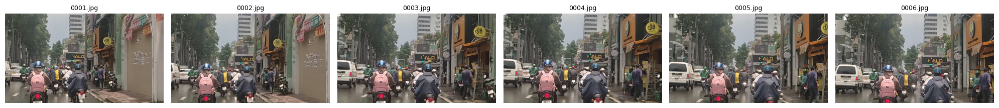

In [4]:
from src.data_loader import list_image_paths, load_image
from src.utils import (show_images)

image_paths = list_image_paths(IMAGE_DIR)

first6_paths = image_paths[:6]
first6_images = [load_image(p) for p in first6_paths]
first6_titles = [p.name for p in first6_paths]

show_images(first6_images, first6_titles, figsize=(20, 5))

# 5. Kiểm tra các hình ảnh bị lỗi

In [5]:
bad_images = []

for path in image_paths:
    img = cv2.imread(str(path))
    if img is None:
        bad_images.append(path)

print("Hình ảnh bị hỏng:", len(bad_images))

Hình ảnh bị hỏng: 0


# 6. Xóa các ảnh bị trùng lặp

Dùng Perceptual Hashing thay vì MD5/SHA vì hash thông thường chỉ phát hiện ảnh giống hệt ở mức byte, chỉ cần đổi 1 pixel hoặc nén lại là hash đã khác hoàn toàn. Perceptual hashing băm theo nội dung thị giác nên vẫn nhận ra ảnh trùng dù bị resize, nén, hay chỉnh sáng nhẹ.

In [6]:
def get_phash(image_path):
    img = Image.open(image_path)
    return imagehash.phash(img)

In [7]:
hashes = {}
duplicates = []
threshold = 5

In [8]:
for path in image_paths:
    current_hash = get_phash(path)

    is_duplicate = False

    for old_path, old_hash in hashes.items():
        distance = current_hash - old_hash
        
        if distance <= threshold:
            duplicates.append(path)
            is_duplicate = True
            break

    if not is_duplicate:
        hashes[path] = current_hash

In [9]:
print("Các ảnh gần giống nhau:", len(duplicates))

Các ảnh gần giống nhau: 684


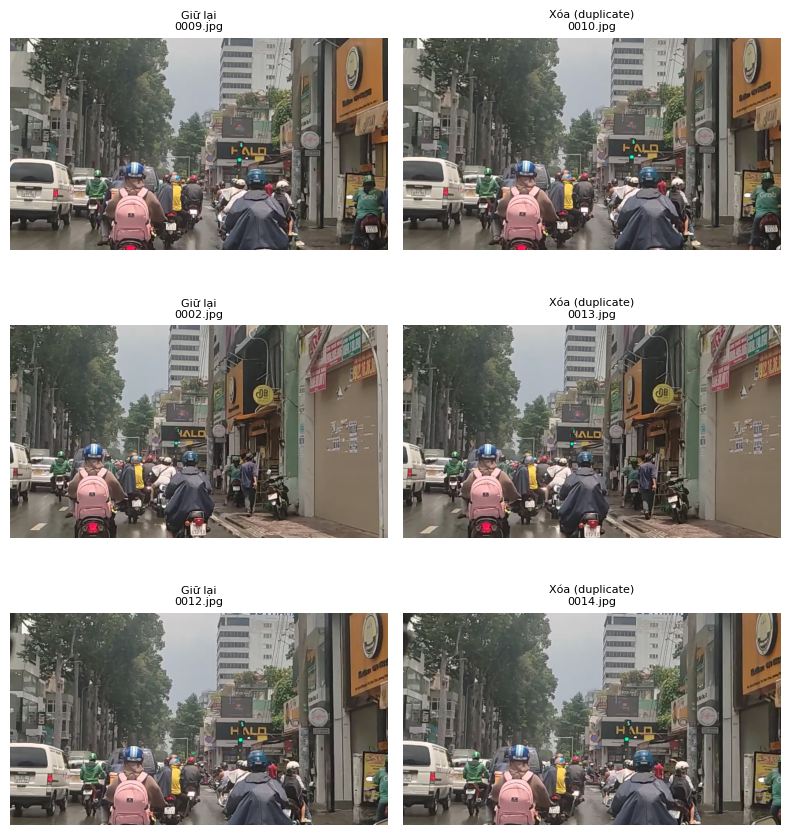

In [10]:
# Hiển thị tối đa 3 cặp duplicate để kiểm tra trước khi xóa
show_pairs = duplicates[:3]
if show_pairs:
    fig, axes = plt.subplots(len(show_pairs), 2, figsize=(8, len(show_pairs) * 3))
    if len(show_pairs) == 1:
        axes = [axes]
    for i, dup_path in enumerate(show_pairs):
        # Tìm ảnh gốc tương ứng (ảnh được giữ lại)
        dup_hash = get_phash(dup_path)
        kept_path = next(
            p for p, h in hashes.items()
            if dup_hash - h <= threshold
        )
        for j, (p, title) in enumerate([(kept_path, "Giữ lại"), (dup_path, "Xóa (duplicate)")]):
            img = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
            axes[i][j].imshow(img)
            axes[i][j].set_title(f"{title}\n{p.name}", fontsize=8)
            axes[i][j].axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("Không tìm thấy duplicate nào.")

In [11]:
# Xóa ảnh
dup_set = set(duplicates)
for path in duplicates:
    os.remove(path)

# Reload lại đúng cấu trúc dataset (ảnh thẳng trong IMAGE_DIR)
image_paths = sorted([
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in VALID_EXT
])

print(f"Ảnh ban đầu    : {len(image_paths) + len(duplicates)}")
print(f"Duplicates xóa : {len(duplicates)}")
print(f"Còn lại        : {len(image_paths)}")

Ảnh ban đầu    : 3216
Duplicates xóa : 684
Còn lại        : 2532


# 7. Thống kê độ phân giải

In [12]:
sizes        = []
brightnesses = []

for path in image_paths:
    img = cv2.imread(str(path))
    if img is not None:
        h, w = img.shape[:2]
        sizes.append((w, h))
        brightnesses.append(
            cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).mean()
        )

Resolution  — Mean: 1197x683 | Min: 540x540 | Max: 1920x1080
Aspect ratio — Mean: 1.76 | Min: 0.56 | Max: 1.78
Brightness   — Mean: 121.0 | Min: 55.7 | Max: 192.0


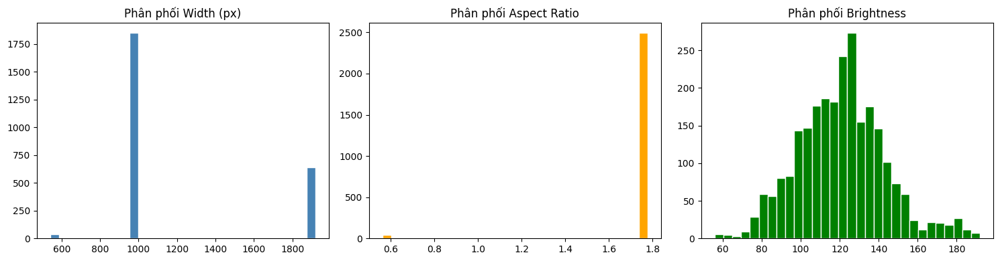

In [13]:
widths  = [x[0] for x in sizes]
heights = [x[1] for x in sizes]
aspects = [w / h for w, h in sizes]

print(f"Resolution  — Mean: {np.mean(widths):.0f}x{np.mean(heights):.0f} | Min: {min(widths)}x{min(heights)} | Max: {max(widths)}x{max(heights)}")
print(f"Aspect ratio — Mean: {np.mean(aspects):.2f} | Min: {min(aspects):.2f} | Max: {max(aspects):.2f}")
print(f"Brightness   — Mean: {np.mean(brightnesses):.1f} | Min: {min(brightnesses):.1f} | Max: {max(brightnesses):.1f}")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(widths,       bins=30, color="steelblue", edgecolor="white")
axes[0].set_title("Phân phối Width (px)")
axes[1].hist(aspects,      bins=30, color="orange",    edgecolor="white")
axes[1].set_title("Phân phối Aspect Ratio")
axes[2].hist(brightnesses, bins=30, color="green",     edgecolor="white")
axes[2].set_title("Phân phối Brightness")
plt.tight_layout()
plt.show()

**Nhận xét:**
- Độ phân giải phân theo 2 cụm rõ rệt (~1000px và ~1900px chiều rộng), không trải đều liên tục  cho thấy dataset đến từ 2 nguồn/thiết bị chụp khác nhau.
- Aspect ratio gần như đồng nhất ở ~1.78 (ảnh ngang 16:9). Có 1 số ít ảnh ở ~0.56 đúng bằng nghịch đảo của 1.78 cho thấy đây là ảnh chụp dọc hoặc bị lưu sai hướng -> Cần kiểm tra và xoay lại đúng hướng
- Độ sáng phân phối dạng chuông, tập trung quanh 120-130, dao động 55.7-192, không có ảnh cực tối/cực sáng bất thường.

# 8. Kiểm tra các ảnh dọc

In [14]:
# Lọc ra các ảnh xoay 90 độ
suspect_paths = []
for path in image_paths:
    img = cv2.imread(str(path))
    if img is None:
        continue
    h, w = img.shape[:2]
    ratio = w / h
    if ratio < 1 and abs((1/ratio) - 1.78) < 0.15:
        suspect_paths.append(path)

print(f"Số ảnh nghi bị xoay 90 độ: {len(suspect_paths)}")

Số ảnh nghi bị xoay 90 độ: 39


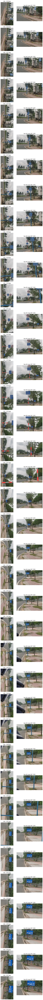

In [15]:
# Hiển thị các ảnh dọc gốc và xoay thử, để xác nhận bằng mắt
n_show = min(39, len(suspect_paths))
fig, axes = plt.subplots(n_show, 2, figsize=(8, 4 * n_show))
for i, path in enumerate(suspect_paths[:n_show]):
    img = cv2.imread(str(path))
    img_rotated = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)  # đổi CW -> CCW

    axes[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f"Gốc: {path.name}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(cv2.cvtColor(img_rotated, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Sau khi xoay 90° CCW")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

In [16]:
# Áp dụng xoay 90° CCW cho toàn bộ ảnh bị lỗi orientation, ghi đè trực tiếp vào dataset
fixed_count = 0
for path in suspect_paths:
    img = cv2.imread(str(path))
    img_rotated = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
    cv2.imwrite(str(path), img_rotated)
    fixed_count += 1

print(f"Đã xoay lại {fixed_count}/{len(suspect_paths)} ảnh trong dataset.")

Đã xoay lại 39/39 ảnh trong dataset.


In [17]:
# Kiểm tra lại aspect ratio đã đúng ~1.78 chưa
recheck_ratios = []
for path in suspect_paths:
    img = cv2.imread(str(path))
    h, w = img.shape[:2]
    recheck_ratios.append(w / h)

print(f"Aspect ratio sau khi xoay — Mean: {np.mean(recheck_ratios):.2f} | Min: {min(recheck_ratios):.2f} | Max: {max(recheck_ratios):.2f}")

Aspect ratio sau khi xoay — Mean: 1.78 | Min: 1.78 | Max: 1.78
